# 前言
GAN的全称为Generative Adversarial Network，翻译成中文就是生成式对抗网络。 在github有个[GAN Zoo](https://github.com/hindupuravinash/the-gan-zoo)，它记录了GAN的发展并提供了相关GAN的论文来源和部分GAN模型的实现。下图为GAN的论文数量随时间的变化，由图可以看出自2014年第一篇GAN的论文问世，GAN的数量就以指数增长形式迅速壮大。虽然GAN的种类千变万化，但它们的结构类似，都含有一个生成器（generator）和一个判别器（discriminator）。
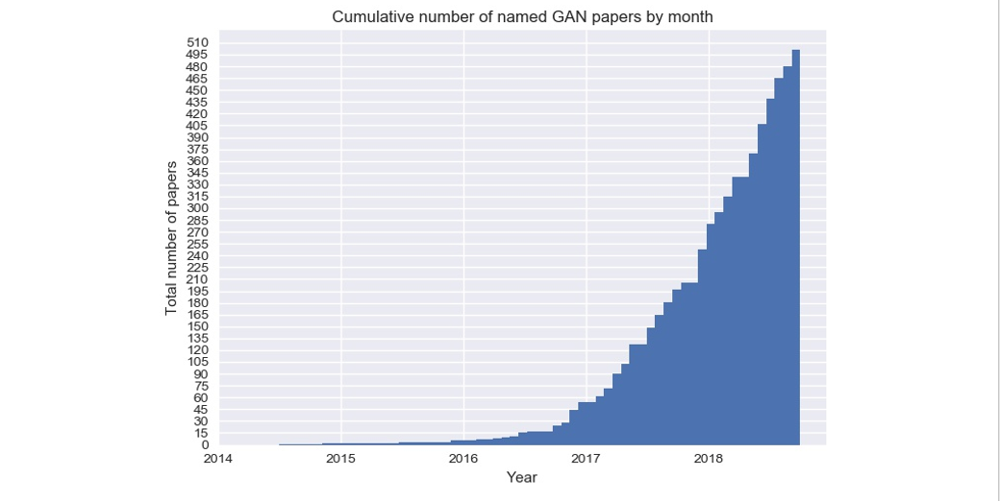
判别器和生成器都是一个神经网络结构，也就是一个黑箱模型。判别器相对比较好理解，就像一个二分类模型，有一个判别界限去区分样本，从概率的角度分析就是获得样本x属于类别y的概率，是一个条件概率P(y|x)。而生成器是需要生成数据的概率分布，就像高斯分布一样，需要去拟合整个分布，从概率角度分析就是样本x在整个分布中对应的概率。
# GAN的相关理论
GAN本质上是在做什么事情呢？
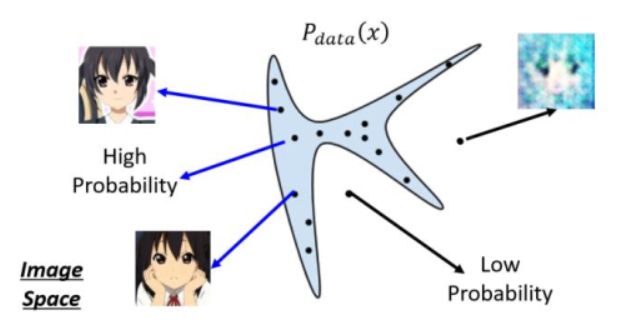
以图像生成为例，我们假设吧每一个图片看作二维空间中的一个点，并且现有图片会满足于某个数据分布，我们记作$P_{data}(x)$。那么在这个图像分布空间中，实际上只有很小一部分的区域是人脸图像。如上图所示，只有在蓝色区域采样出的点才会看起来像人脸，而在蓝色区域外采样出来的点就不是人脸。而在GAN中我们需要做的就是让机器找到人脸的分布函数，这也是GAN本质上做的事情。
## Generator
如下图所示，我们需要训练出这样一个生成器，对于一个已知分布的数据z，我们可以通过生成器把数据转化成一个高维向量，它可以表示为一个图片、文本、声音等。只要我们随机输入多个z，就可以生成一个关于数据x的分布，我们把它称作$P_{G}(x)$。而真实数据也对应一个分布$P_{data}(x)$，生成器的目标是使$P_{G}(x)$和$P_{data}(x)$这两个分布越相似越好。我们知道对于回归和分类模型，都有对应的目标函数，我们只需使这个目标函数达到最优，即可得出一个比较好的回归或分类模型。那么对于两个分布，我们可以利用散度（Divergence，简称Div）这个评价指标来衡量两个分布之间的相似性。Div越小就表示两个分布越相似。那么我们可以将Div作为训练G的目标函数，我们的目标是使Div最小。
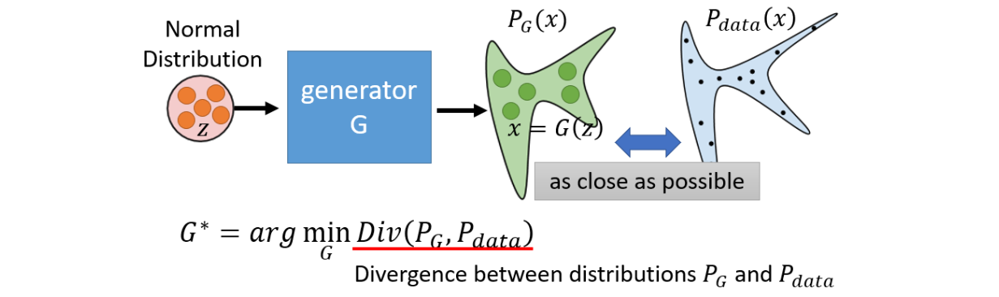
## Discriminator
现在有一个最关键的问题是，两个分布之间的Div要如何计算出来呢？理论上来说我们不知道$P_{G}(x)$和$P_{data}(x)$是什么，因此Div我们是无法计算的。因此我们需要构建一个新的网络，它的作用是衡量$P_{G}(x)$和$P_{data}(x)$之间的Div，因此我们有了这样一个网络——判别器。
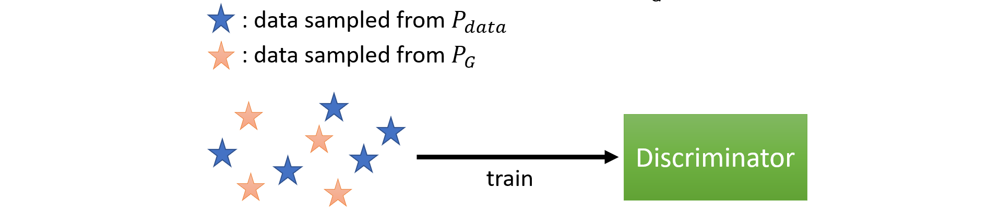
图中，蓝色星星是从$P_{data}$（真实数据）中采样出的数据，黄色星星是从$P_{G}$（生成的数据）中采样出的数据，现在我们将这两组数据交给判别器，判别器的功能是判别读入的数据是来自$P_{data}$还是$P_{G}$。如果输入数据是$P_{data}$，那么经过判别器后就输出一个较大的值（可以近似理解为输出1）。如果输入数据是$P_{G}$，那么经过判别器后就输出一个较小的值（可以近似理解为输出0）。熟悉分类模型的同学可能就会说判别器不就相当于是一个二分类模型吗？而前面不是说我们是以Div的大小来判断两个分布之间的相似程度。现在我们就用公式推导出Div和二分类模型的目标函数之间的相关性。
我们先来看一下判别器的目标函数：
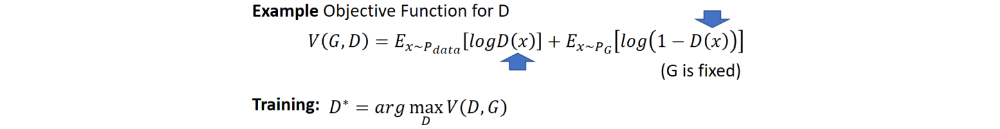
从式子本身理解的话，数据来源于$P_{data}$，D(x)要尽可能大，数据来源于$P_{G}$，D(x)要尽可能小。这样的话$V(G,D)$就越大。以最大化$V(G,D)$为目标函数，就可以使得输入数据是$P_{G}$，经过判别器后就输出一个较小的值，相反则输入一个较大的值。这样就达到了区分读入的数据是来自$P_{data}$还是$P_{G}$的目的。
接下来我们将目标函数展开：
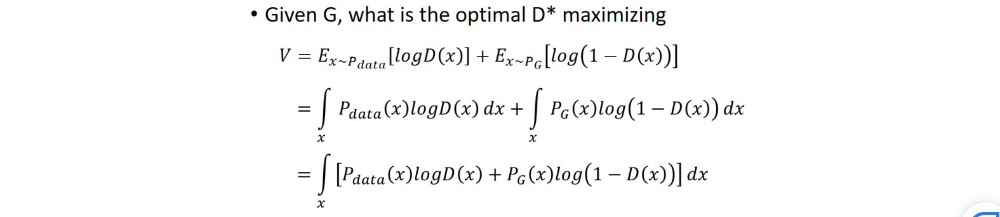
假设判别器十分强大，它模拟出的D(x)可以表示任何函数，给定一个x，都有一个D(x)使得表达式$P_{data}(x)logD(x)+P_{G}(x)log(1-D(x))$最大，求导令其为0可以得出：
$$D^{*}(x)=\frac{P_{data}(x)}{P_{data}(x)+P_{G}(x)}$$
现在把$D^{*}(x)$带入到目标函数中得到：
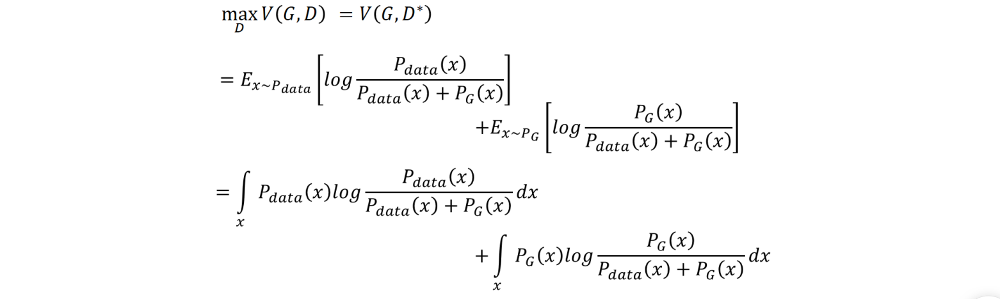
将表达式中分子分母都除于2可得：
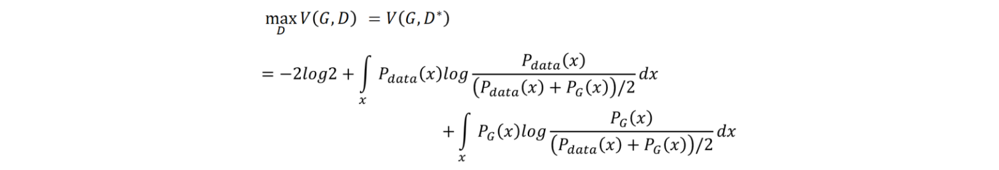
这个表达式等价为：
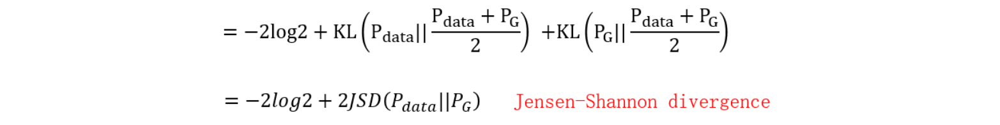
至此我们可以得知通过一定的假设，得出散度的计算类似于二分类器的目标函数的计算。因此可以看出判别器的本质就是一个二分类器，这样就有利于我们后面代码的实现。
现在我们再回到生成器，生成器的目的是让生成数据$P_{G}$和真实数据$P_{data}$之间的Div最小，本来Div是没办法计算的，但是现在有了判别器之后，Div变得可以计算了，于是生成器新的目标函数变为：
$$G^{*}=arg\underset{G}{min}\underset{D}{V(G,D)}$$
至此，GAN就变成了一个求解最小最大值的问题，接下来就可以用最基本的梯度下降法求解这个问题。
下面我们用一个完整的伪算法来回顾一下GAN模型训练的整个流程。
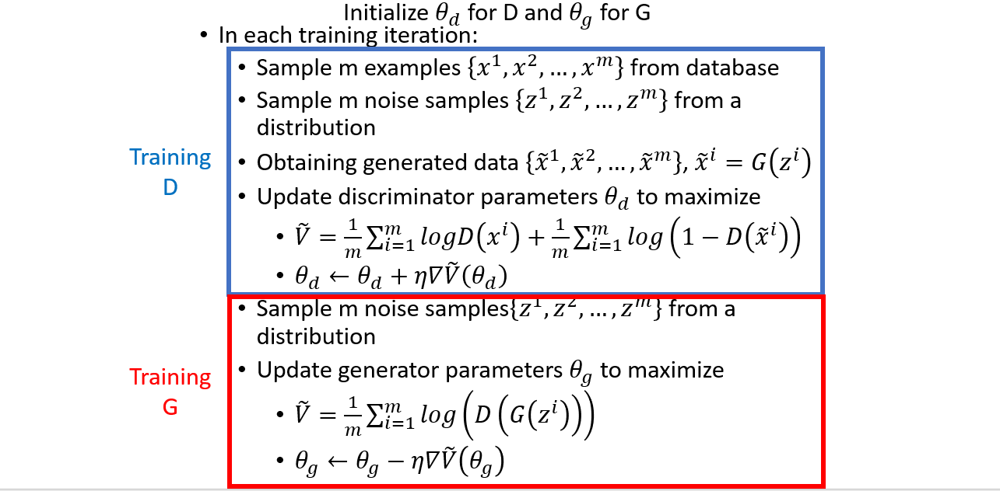
这段伪代码的意思是，首先我们初始化生成器和判别器的参数，接下来规定一个总迭代次数，每轮训练的迭代次数也确定（这个根据数据量大小确定，一般是3-5次为一轮），在每轮训练中，我们先训练判别器，先从真实数据分布$P_{data}(x)$中抽样x，然后从先验分布中抽样z，并通过生成器产生数据$\overset{-}{x}$，接着把x和$\overset{-}{x}$丢入判别器中训练，使得目标函数$\overset{-}{V}$最大；接下来我们训练生成器，从先验分布中抽样新的z，接下来把z丢进生成器中训练，使得目标函数$\overset{-}{V}$最小，其实这一步就是让这一轮训练好的判别器认为生成器生成的是真实的数据。这样循环交替，最终生成器产生的数据$\overset{-}{x}$就会越来越接近真实数据x。
## 实验部分
这部分我将用GAN实现一个动画人脸的生成，利用的模型是DCGAN，它在原始GAN模型的基础上，将生成器和判别器的网络结构换成了当时已经十分成熟的卷积神经网络结构，并对卷积神经网络结构进行一定的调整，克服了原始GAN训练不稳定和梯度消失的问题。具体改变有：
- 取消所有的pooling层。生成器中使用fractionally strided convolution代替pooling层，判别器中使用strided convolution代替pooling层。
- 在生成器和判别器中都使用批量标准化
- 去除了全连接层
- 生成器中使用ReLU作为激活函数，最后一层使用tanh激活函数
- 判别器中使用LeakyReLU作为激活函数
DCGAN的网络结构如下图所示：
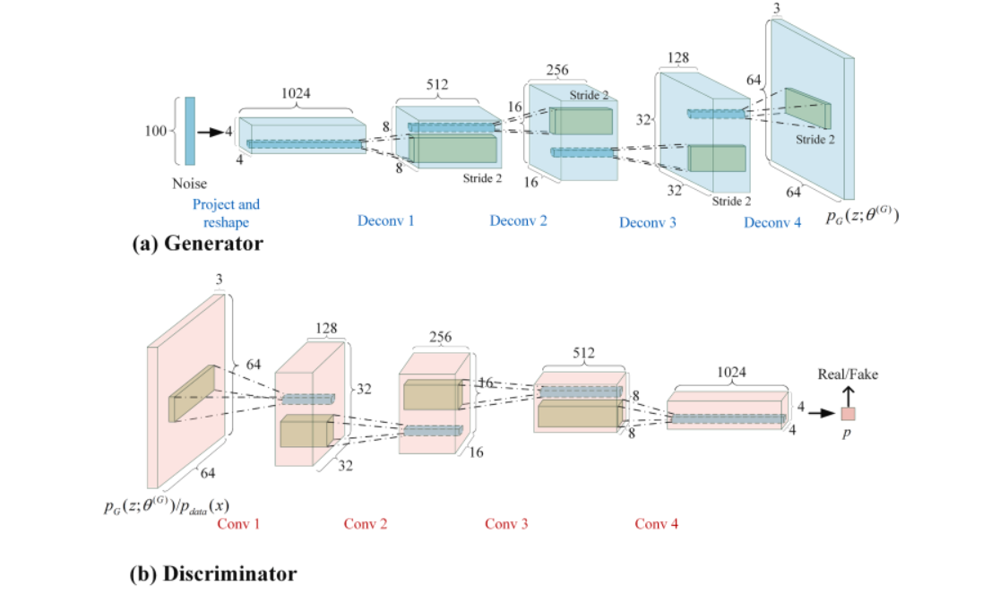
现在让我们来实现这一部分，首先我们设置随机种子的个数（这部分直接复制粘贴就好）

In [2]:
import random
import torch
import numpy as np

seed = 2022
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
torch.backends.cudnn.benchmark = False
torch.backends.cudnn.deterministic = True

接下来我们对图片数据进行处理，这里需要调用一些包

In [3]:
import os
import glob
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader

# DataSet
class AnimeDataSet(Dataset):
    def __init__(self, fnames, transform):
        self.fnames = fnames
        self.transform = transform
    
    def __len__(self):
        return len(self.fnames)
    
    def __getitem__(self, idx):
        fname = self.fnames[idx]
        # 加载图片
        img = torchvision.io.read_image(fname)
        # 使用transform对图片进行修改和归一化处理
        img = self.transform(img)
        return img

# 获取数据
dataset_dir = r'E:\软件包\Chrome\机器学习数据\AnimeDataset\faces'
fnames = glob.glob(os.path.join(dataset_dir, '*'))
# 1. 修改图片尺寸为(64, 64)
# 2. 将数值从 [0, 1] 线性映射到 [-1, 1]
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5, 0.5, 0.5),std=(0.5, 0.5, 0.5)),
])
dataset = AnimeDataSet(fnames,transform)

展示一组图片

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


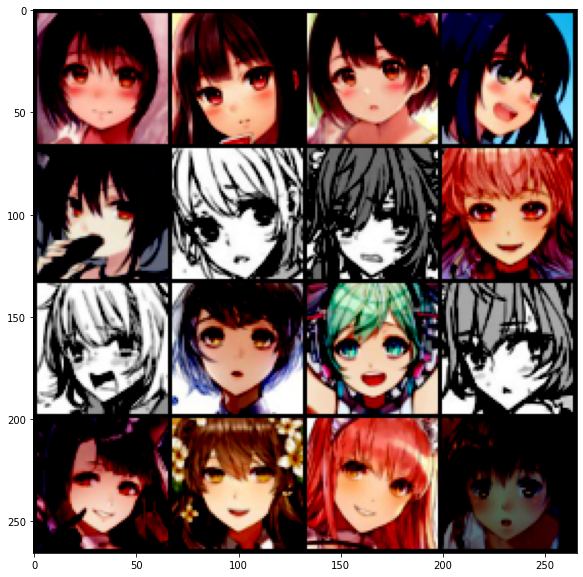

In [4]:
import matplotlib.pyplot as plt

images = [dataset[i] for i in range(16)]
grid_img = torchvision.utils.make_grid(images, nrow=4)
plt.figure(figsize=(10, 10))
plt.imshow(grid_img.permute(1, 2, 0))

注意我们数据的范围是[-1,1]，因此我们需要将其转换为[0,1]，才能展示出正确的图片

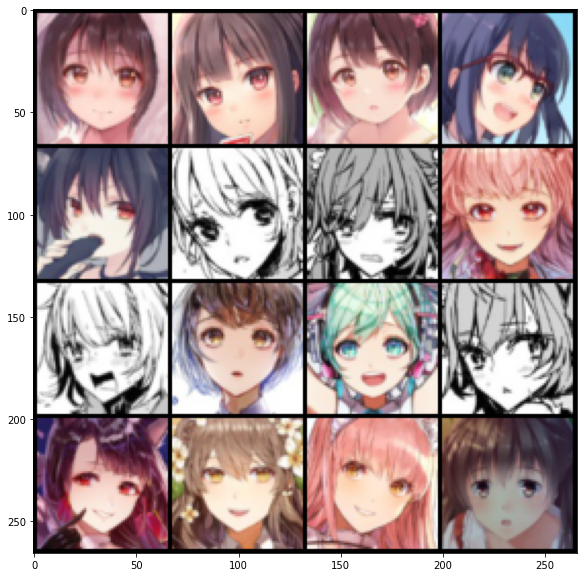

In [5]:
images = [(dataset[i] + 1) / 2 for i in range(16)]
grid_img = torchvision.utils.make_grid(images, nrow=4)
plt.figure(figsize=(10, 10))
plt.imshow(grid_img.permute(1, 2, 0))

# Model
现在实现模型的部分，这里实现的是DCGAN。下图为论文中DCGAN的模型架构，为了加快运行速度，我们起始为512，减少模型的参数，这一部分也可以自行修改

In [10]:
import torch.nn as nn
from torch.autograd import Variable

# 模型参数初始化
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)  # 均值为0，标准差为0.02的正态分布
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)             # 均值为1，标准差为0.02的正态分布

# 生成器
class Generator(nn.Module):
    def __init__(self, in_dim):
        super(Generator, self).__init__()
        def dconv_bn_relu(in_dim, out_dim):
            return nn.Sequential(
                nn.ConvTranspose2d(in_dim, out_dim, kernel_size=5, stride=2, padding=2, output_padding=1, bias=False),
                nn.BatchNorm2d(out_dim),
                nn.ReLU(),
            )
        self.l1 = nn.Sequential(
            nn.Linear(in_dim, 512 * 4 * 4),
            nn.BatchNorm1d(512 * 4 * 4),
            nn.ReLU(),
        )
        self.l2_5 = nn.Sequential(
            dconv_bn_relu(512, 256),
            dconv_bn_relu(256, 128),
            dconv_bn_relu(128, 64),
            nn.ConvTranspose2d(64, 3, kernel_size=5, stride=2, padding=2, output_padding=1),
            nn.Tanh(),
        )
        self.apply(weights_init)
    
    def forward(self, x):
        y = self.l1(x)
        y = y.view(y.size(0), -1, 4, 4)
        y = self.l2_5(y)
        return y

# 判别器
class Discriminator(nn.Module):
    def __init__(self, in_dim):
        super(Discriminator, self).__init__()
        def conv_bn_lrelu(in_dim, out_dim):
            return nn.Sequential(
                nn.Conv2d(in_dim, out_dim, 5, 2, 2),
                nn.BatchNorm2d(out_dim),
                nn.LeakyReLU(0.2),
            )
        self.ls = nn.Sequential(
            nn.Conv2d(in_dim, 64, 5, 2, 2), nn.LeakyReLU(0.2),
            conv_bn_lrelu(64, 128),
            conv_bn_lrelu(128, 256),
            conv_bn_lrelu(256, 512),
            nn.Conv2d(512, 1, 4),
            nn.Sigmoid(),
        )
        
        self.apply(weights_init)
    
    def forward(self, x):
        y = self.ls(x)
        y = y.view(-1)
        return y    

设定好超参数，准备好dataloader，model，loss criterion，optimizer

In [11]:
# 设置一些超参数
batch_size = 64
z_dim = 100
z_sample = Variable(torch.randn(100, z_dim)).cuda()         # 随机生成100个样本，用于检测模型的训练结果
lr = 1e-4
n_epoch = 10

# 生成一个文件目录，用于保存模型结果
save_dir = './logs'
os.makedirs(save_dir, exist_ok=True)

# dataloader
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# model
G = Generator(in_dim=z_dim).cuda()
D = Discriminator(in_dim=3).cuda()
G.train()
D.train()

# loss criterion
criterion = nn.BCELoss()

# optimizer
opt_G = torch.optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))
opt_D = torch.optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.999))

# Training

Epoch [1/10] 1115/1115 Loss_D: 0.1780 Loss_G: 3.8462 | save samples to ./logs\Epoch_001.jpg


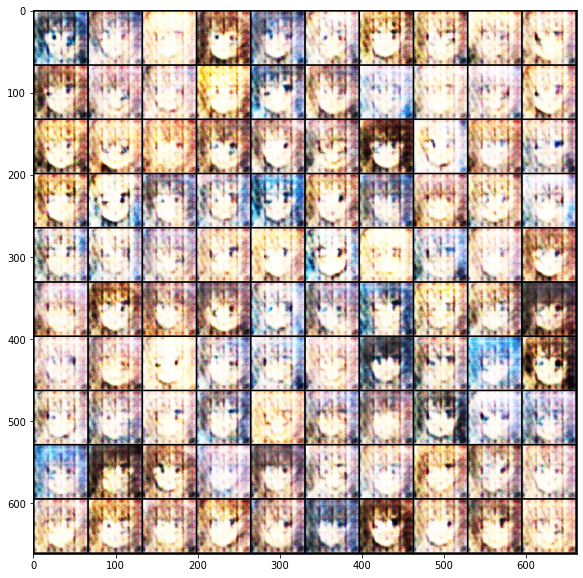

Epoch [2/10] 1115/1115 Loss_D: 0.2923 Loss_G: 3.1647 | save samples to ./logs\Epoch_002.jpg


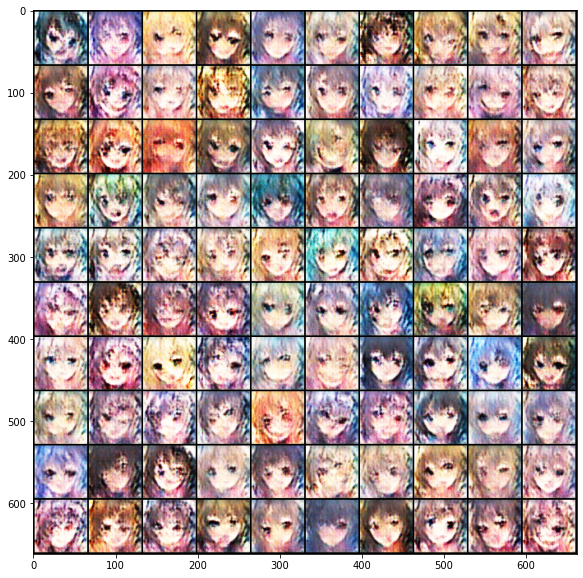

Epoch [3/10] 1115/1115 Loss_D: 0.1190 Loss_G: 4.1651 | save samples to ./logs\Epoch_003.jpg


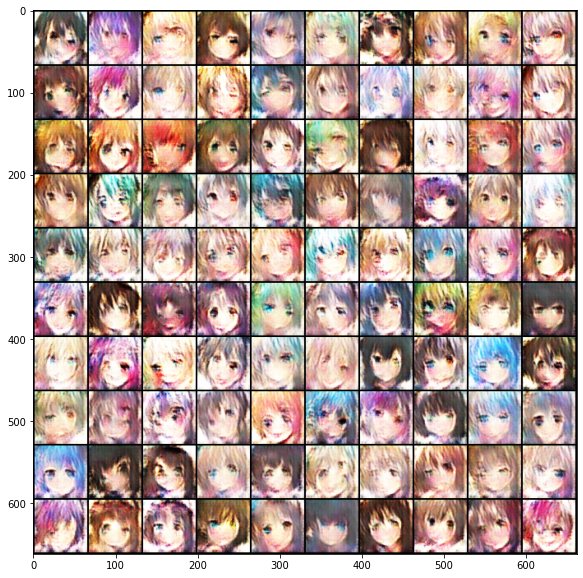

Epoch [4/10] 1115/1115 Loss_D: 0.1803 Loss_G: 4.8173 | save samples to ./logs\Epoch_004.jpg


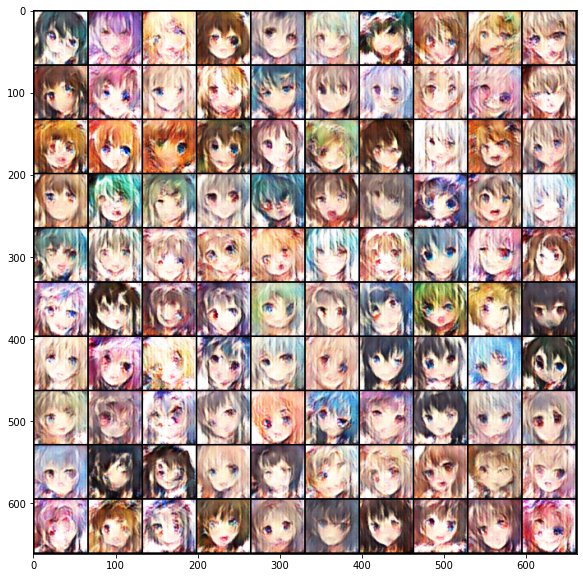

Epoch [5/10] 1115/1115 Loss_D: 0.3816 Loss_G: 5.1071 | save samples to ./logs\Epoch_005.jpg


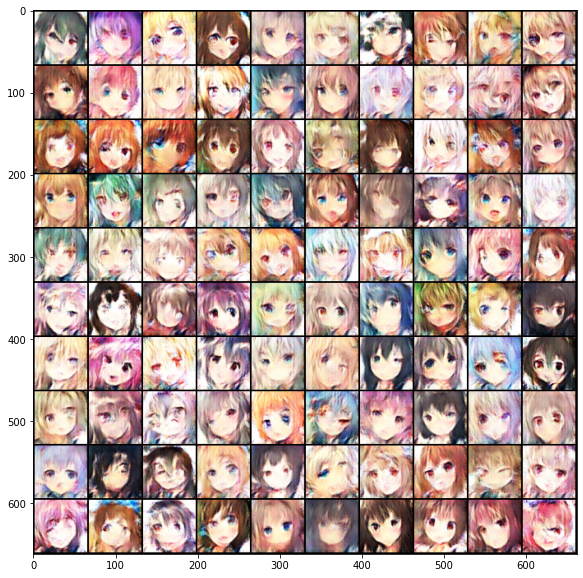

Epoch [6/10] 1115/1115 Loss_D: 0.3021 Loss_G: 5.8084 | save samples to ./logs\Epoch_006.jpg


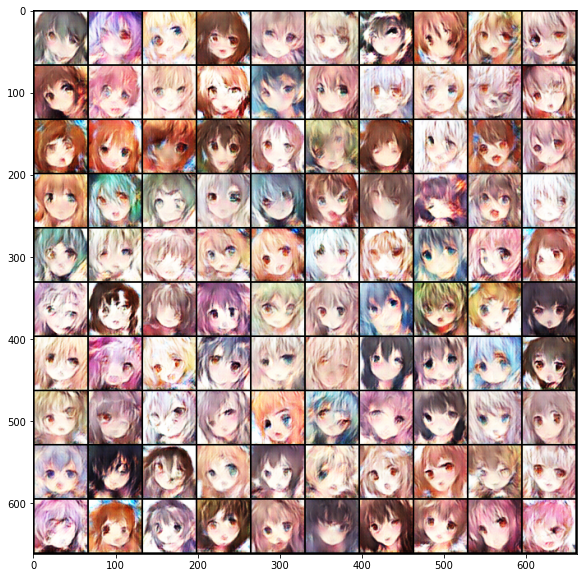

Epoch [7/10] 1115/1115 Loss_D: 0.1996 Loss_G: 1.8779 | save samples to ./logs\Epoch_007.jpg


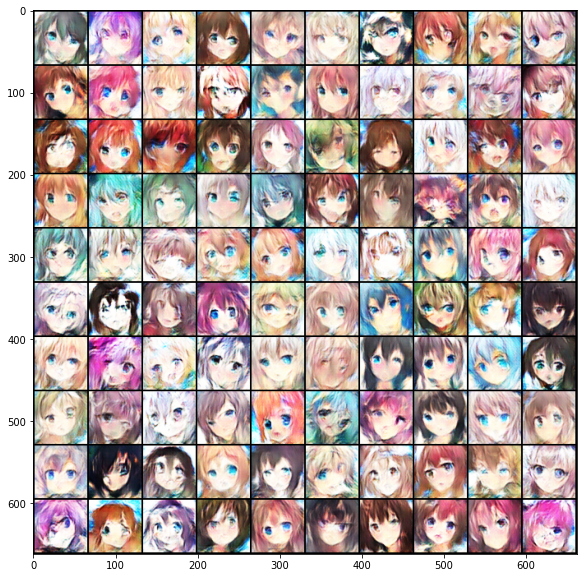

Epoch [8/10] 1115/1115 Loss_D: 0.1340 Loss_G: 2.7159 | save samples to ./logs\Epoch_008.jpg


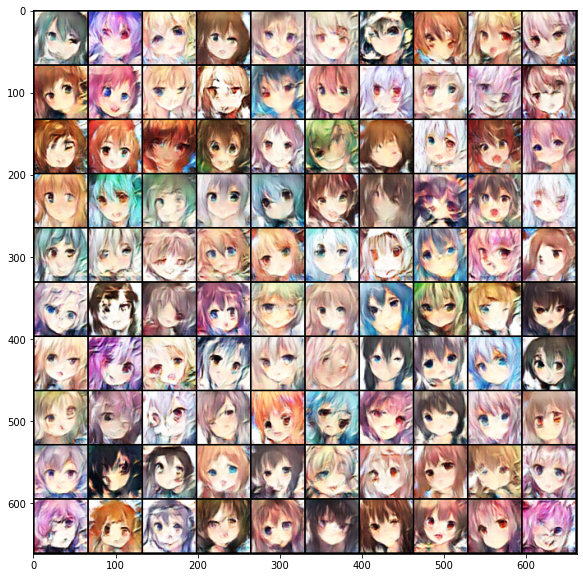

Epoch [9/10] 1115/1115 Loss_D: 0.1774 Loss_G: 3.6487 | save samples to ./logs\Epoch_009.jpg


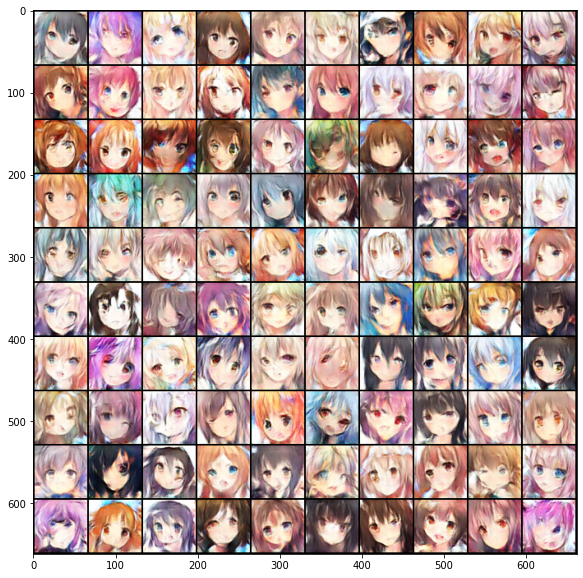

Epoch [10/10] 1115/1115 Loss_D: 0.0604 Loss_G: 4.6149 | save samples to ./logs\Epoch_010.jpg


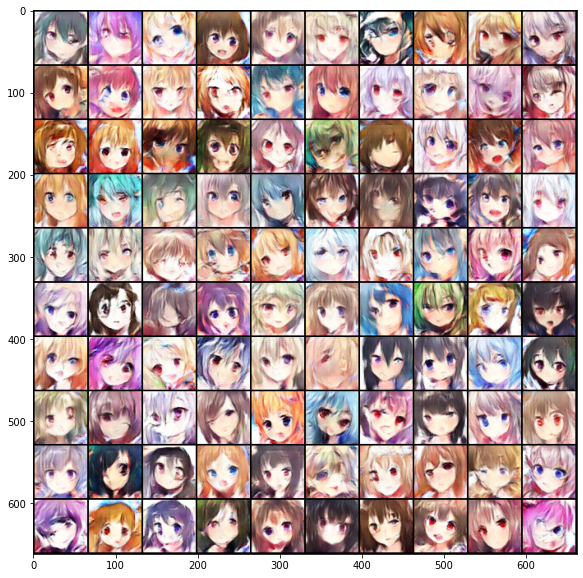

In [12]:
for epoch in range(n_epoch):
    for i, data in enumerate(dataloader):
        imgs = data.cuda()
        
        bs = imgs.size(0)
        
        """训练D"""
        z = Variable(torch.randn(bs, z_dim)).cuda()
        g_imgs = G(z)                      # 生成的概率分布
        r_imgs = Variable(imgs).cuda()     # 真实数据的概率分布
        
        # 对两种数据打标签，真实为1，生成的为0
        g_label = torch.zeros((bs)).cuda()
        r_label = torch.ones((bs)).cuda()
        
        # 两种数据经过判别器
        g_logits = D(g_imgs)
        r_logits = D(r_imgs)
        
        # 计算D的loss
        g_loss = criterion(g_logits, g_label)
        r_loss = criterion(r_logits, r_label)
        loss_D = (g_loss + r_loss) / 2
        
        # 后向传播更新D的模型参数
        D.zero_grad()
        loss_D.backward()
        opt_D.step()
        
        """训练G"""
        z = Variable(torch.randn(bs, z_dim)).cuda()
        g_imgs = G(z)
        
        # 生成数据经过判别器
        g_logits = D(g_imgs)
        
        # 计算loss
        loss_G = criterion(g_logits, r_label)     # 生成器的目的是生成和真实数据一样的分布，因此用的是r_label
        
        # 后向传播更新G的模型参数
        G.zero_grad()
        loss_G.backward()
        opt_G.step()
        
        # 打印当前模型训练的状态
        print(f'\rEpoch [{epoch+1}/{n_epoch}] {i+1}/{len(dataloader)} Loss_D: {loss_D.item():.4f} Loss_G: {loss_G.item():.4f}', end='')
    # 每进行一次epoch，生成一组图片，用于评估模型训练的情况
    G.eval()
    g_imgs_sample = (G(z_sample).data + 1) / 2
    filename = os.path.join(save_dir, f'Epoch_{epoch + 1:03d}.jpg')
    torchvision.utils.save_image(g_imgs_sample, filename, nrow=10)
    print(f' | save samples to {filename}')
    
    # 展示生成的图片
    grid_img = torchvision.utils.make_grid(g_imgs_sample.cpu(), nrow=10)
    plt.figure(figsize=(10, 10))
    plt.imshow(grid_img.permute(1, 2, 0))
    plt.show()
    
    # 将G转换成训练模型
    G.train()

# 模型保存
torch.save(G.state_dict(), os.path.join(save_dir, f'dcgan_g.pth'))
torch.save(D.state_dict(), os.path.join(save_dir, f'dcgan_d.pth'))    

现在我们就可以利用我们训练好的Generator来随机生成图片

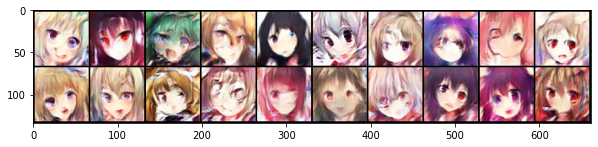

In [14]:
# 模型加载
G = Generator(z_dim)
G.load_state_dict(torch.load(os.path.join(save_dir,'dcgan_g.pth')))
G.eval()
G.cuda()

n_output = 20
z_sample = Variable(torch.randn(n_output, z_dim)).cuda()
imgs_sample = (G(z_sample).data + 1) / 2.0
filename = os.path.join(save_dir, f'result.jpg')
torchvision.utils.save_image(imgs_sample, filename, nrow=10)
# show image
grid_img = torchvision.utils.make_grid(imgs_sample.cpu(), nrow=10)
plt.figure(figsize=(10,10))
plt.imshow(grid_img.permute(1, 2, 0))
plt.show()